# Set Up

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# installs
! pip install spacy
! pip install wordcloud
! pip install nltk
! pip install scikit-plot
! pip install umap-learn

In [ ]:
# imports


import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scikitplot as skplot
import nltk
import spacy
import os, sys, email,re
import string

from sklearn.cluster import KMeans 
from sklearn.decomposition import PCA
from sklearn.preprocessing import normalize
from sklearn.metrics import pairwise_distances

from nltk.tokenize import word_tokenize
from nltk.stem.porter import PorterStemmer
from nltk.corpus import stopwords

from bs4 import BeautifulSoup
from scipy.stats import multivariate_normal as mvn

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer,TfidfVectorizer  

import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')

from pylab import *
import random
import pylab
import seaborn as sns; sns.set_style('whitegrid')
import wordcloud
from fbprophet import Prophet
from wordcloud import WordCloud, STOPWORDS
import gc

import networkx as nx

import warnings
if not sys.warnoptions:
    warnings.simplefilter("ignore")

# Load Date

In [ ]:
email =pd.read_csv("/content/drive/Shareddrives/820 team/dataset/emails.csv")
#df1 = pd.read_csv("/content/drive/Shareddrives/820 team/dataset/clean-data.csv")

In [ ]:
email.shape

(517401, 2)

In [ ]:
df = email.sample(frac = 0.1, random_state=2).reset_index().drop(columns="index")

In [ ]:
df = email.copy()

In [ ]:
df.head(5)

,file,message
0,allen-p/_sent_mail/1.,Message-ID: <18782981.1075855378110.JavaMail.e...
1,allen-p/_sent_mail/10.,Message-ID: <15464986.1075855378456.JavaMail.e...
2,allen-p/_sent_mail/100.,Message-ID: <24216240.1075855687451.JavaMail.e...
3,allen-p/_sent_mail/1000.,Message-ID: <13505866.1075863688222.JavaMail.e...
4,allen-p/_sent_mail/1001.,Message-ID: <30922949.1075863688243.JavaMail.e...


In [ ]:
df.shape

(517401, 2)

# Data Exploratory

In [ ]:
# a sample email
print(df.loc[90000]['message'])

Message-ID: <8314827.1075854498481.JavaMail.evans@thyme>
Date: Tue, 2 Jan 2001 14:45:00 -0800 (PST)
From: david.delainey@enron.com
To: john.lavorato@enron.com
Subject: Re:
Mime-Version: 1.0
Content-Type: text/plain; charset=us-ascii
Content-Transfer-Encoding: 7bit
X-From: David W Delainey
X-To: John J Lavorato
X-cc: 
X-bcc: 
X-Folder: \David_Delainey_Jun2001\Notes Folders\All documents
X-Origin: Delainey-D
X-FileName: ddelain.nsf

yes - we should arrange to get together on Sunday to discuss bonus, comp, 
promotions and rankings before the PRC on Monday.  I am back Saturday night. 
I hope this works let me know a time.



Regards
Delainey


In [ ]:

# transform the email into correct format
message = df.loc[1]['message']
e = email.message_from_string(message)

e.items()

[('Message-ID', '<15464986.1075855378456.JavaMail.evans@thyme>'),
 ('Date', 'Fri, 4 May 2001 13:51:00 -0700 (PDT)'),
 ('From', 'phillip.allen@enron.com'),
 ('To', 'john.lavorato@enron.com'),
 ('Subject', 'Re:'),
 ('Mime-Version', '1.0'),
 ('Content-Type', 'text/plain; charset=us-ascii'),
 ('Content-Transfer-Encoding', '7bit'),
 ('X-From', 'Phillip K Allen'),
 ('X-To', 'John J Lavorato <John J Lavorato/ENRON@enronXgate@ENRON>'),
 ('X-cc', ''),
 ('X-bcc', ''),
 ('X-Folder', "\\Phillip_Allen_Jan2002_1\\Allen, Phillip K.\\'Sent Mail"),
 ('X-Origin', 'Allen-P'),
 ('X-FileName', 'pallen (Non-Privileged).pst')]

In [ ]:
# get date
e.get('Date')

'Fri, 4 May 2001 13:51:00 -0700 (PDT)'

In [ ]:
# show message body
e.get_payload()

"Traveling to have a business meeting takes the fun out of the trip.  Especially if you have to prepare a presentation.  I would suggest holding the business plan meetings here then take a trip without any formal business meetings.  I would even try and get some honest opinions on whether a trip is even desired or necessary.\n\nAs far as the business meetings, I think it would be more productive to try and stimulate discussions across the different groups about what is working and what is not.  Too often the presenter speaks and the others are quiet just waiting for their turn.   The meetings might be better if held in a round table discussion format.  \n\nMy suggestion for where to go is Austin.  Play golf and rent a ski boat and jet ski's.  Flying somewhere takes too much time.\n"

In [ ]:
# now we add those fields into our 'df' dataframe
def get_field(field, messages):
    column = []
    for message in messages:
        e = email.message_from_string(message)
        column.append(e.get(field))
    return column

In [ ]:
df['date'] = get_field("Date", df['message'])
df['subject'] = get_field("Subject", df['message'])
df['X-Folder'] = get_field("X-Folder", df['message'])
df["From"]= get_field("From", df['message'])
df["To"]= get_field("To", df['message'])
df['X-From'] = get_field("X-From", df['message'])
df['X-To'] = get_field("X-To", df['message'])
df.head(3)

,file,message,date,subject,X-Folder,From,To,X-From,X-To
0,allen-p/_sent_mail/1.,Message-ID: <18782981.1075855378110.JavaMail.e...,"Mon, 14 May 2001 16:39:00 -0700 (PDT)",,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",phillip.allen@enron.com,tim.belden@enron.com,Phillip K Allen,Tim Belden <Tim Belden/Enron@EnronXGate>
1,allen-p/_sent_mail/10.,Message-ID: <15464986.1075855378456.JavaMail.e...,"Fri, 4 May 2001 13:51:00 -0700 (PDT)",Re:,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",phillip.allen@enron.com,john.lavorato@enron.com,Phillip K Allen,John J Lavorato <John J Lavorato/ENRON@enronXg...
2,allen-p/_sent_mail/100.,Message-ID: <24216240.1075855687451.JavaMail.e...,"Wed, 18 Oct 2000 03:00:00 -0700 (PDT)",Re: test,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,phillip.allen@enron.com,leah.arsdall@enron.com,Phillip K Allen,Leah Van Arsdall


In [ ]:
# extract message body
def body(messages):
    column = []
    for message in messages:
        e = email.message_from_string(message)
        column.append(e.get_payload())
    return column

df['body'] = body(df['message'])
df.head(3)

,file,message,date,subject,X-Folder,From,To,X-From,X-To,body
0,allen-p/_sent_mail/1.,Message-ID: <18782981.1075855378110.JavaMail.e...,"Mon, 14 May 2001 16:39:00 -0700 (PDT)",,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",phillip.allen@enron.com,tim.belden@enron.com,Phillip K Allen,Tim Belden <Tim Belden/Enron@EnronXGate>,Here is our forecast\n\n
1,allen-p/_sent_mail/10.,Message-ID: <15464986.1075855378456.JavaMail.e...,"Fri, 4 May 2001 13:51:00 -0700 (PDT)",Re:,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",phillip.allen@enron.com,john.lavorato@enron.com,Phillip K Allen,John J Lavorato <John J Lavorato/ENRON@enronXg...,Traveling to have a business meeting takes the...
2,allen-p/_sent_mail/100.,Message-ID: <24216240.1075855687451.JavaMail.e...,"Wed, 18 Oct 2000 03:00:00 -0700 (PDT)",Re: test,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,phillip.allen@enron.com,leah.arsdall@enron.com,Phillip K Allen,Leah Van Arsdall,test successful. way to go!!!


In [ ]:
# extract emlpoyee names
def employee(file):
    column = []
    for string in file:
        column.append(string.split("/")[0])
    return column

df['employee'] = employee(df['file'])
df.head(3)

,file,message,date,subject,X-Folder,From,To,X-From,X-To,body,employee
0,allen-p/_sent_mail/1.,Message-ID: <18782981.1075855378110.JavaMail.e...,"Mon, 14 May 2001 16:39:00 -0700 (PDT)",,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",phillip.allen@enron.com,tim.belden@enron.com,Phillip K Allen,Tim Belden <Tim Belden/Enron@EnronXGate>,Here is our forecast\n\n,allen-p
1,allen-p/_sent_mail/10.,Message-ID: <15464986.1075855378456.JavaMail.e...,"Fri, 4 May 2001 13:51:00 -0700 (PDT)",Re:,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",phillip.allen@enron.com,john.lavorato@enron.com,Phillip K Allen,John J Lavorato <John J Lavorato/ENRON@enronXg...,Traveling to have a business meeting takes the...,allen-p
2,allen-p/_sent_mail/100.,Message-ID: <24216240.1075855687451.JavaMail.e...,"Wed, 18 Oct 2000 03:00:00 -0700 (PDT)",Re: test,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,phillip.allen@enron.com,leah.arsdall@enron.com,Phillip K Allen,Leah Van Arsdall,test successful. way to go!!!,allen-p


## Top 15 Folders

In [ ]:
print("number of folders: ", df.shape[0])
print("number of unique folders: ", df['X-Folder'].unique().shape[0])

number of folders:  51740
number of unique folders:  3234


In [ ]:
unique_emails = pd.DataFrame(df['X-Folder'].value_counts())
unique_emails.reset_index(inplace=True)


unique_emails.columns = ['folder_name', 'count']
# top 15 folders
unique_emails.iloc[:15,:]

,folder_name,count
0,\Kay_Mann_June2001_1\Notes Folders\All documents,670
1,\Jeff_Dasovich_June2001\Notes Folders\All docu...,587
2,\Tanya_Jones_Dec2000\Notes Folders\All documents,572
3,\Sara_Shackleton_Dec2000_June2001_1\Notes Fold...,520
4,\Kay_Mann_June2001_2\Notes Folders\Discussion ...,494
5,\Vincent_Kaminski_Jun2001_1\Notes Folders\All ...,479
6,\Jeff_Dasovich_Dec2000\Notes Folders\All docum...,458
7,\Kay_Mann_June2001_3\Notes Folders\Sent,436
8,\Vincent_Kaminski_Jun2001_2\Notes Folders\Disc...,424
9,\Kay_Mann_June2001_4\Notes Folders\'sent mail,408


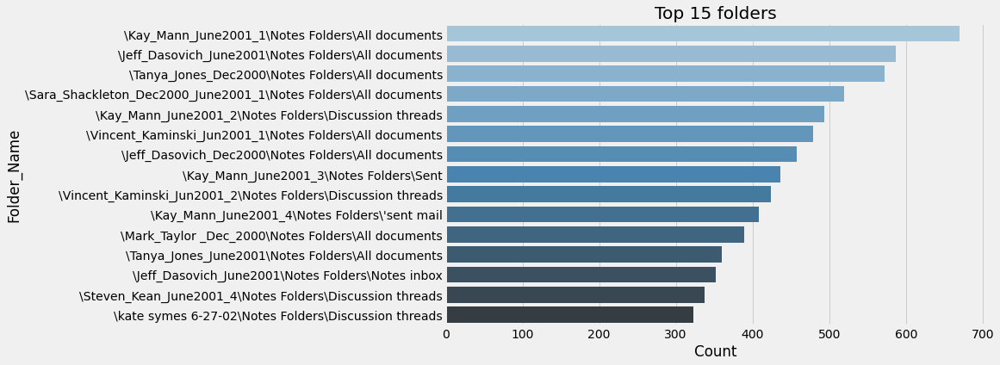

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(x='count', y='folder_name', data=unique_emails.iloc[:15, :], palette="Blues_d")
plt.title("Top 15 folders")
plt.xlabel("Count")
plt.ylabel("Folder_Name")
plt.show()

## Top 15 Senders

In [ ]:
top_15 = pd.DataFrame(df['employee'].value_counts()[:15])
top_15.reset_index(inplace=True)
top_15.columns = ["Employee_name", "Counts"]
top_15

,Employee_name,Counts
0,kaminski-v,2853
1,dasovich-j,2800
2,kean-s,2567
3,mann-k,2302
4,jones-t,1967
5,shackleton-s,1822
6,taylor-m,1360
7,farmer-d,1331
8,germany-c,1243
9,beck-s,1140


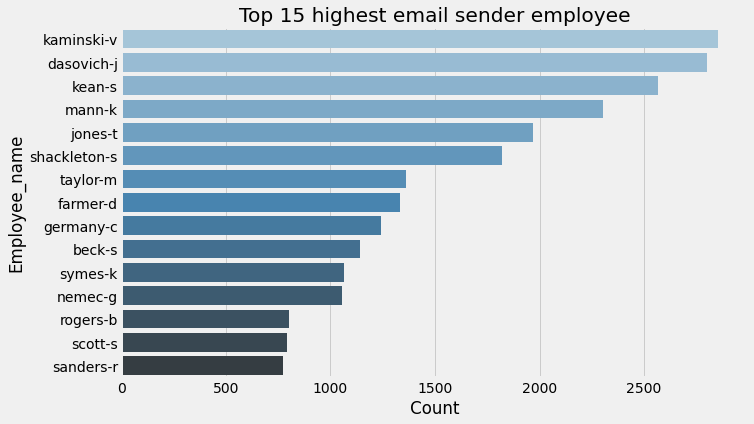

In [ ]:
plt.figure(figsize=(10,6))

sns.barplot(y="Employee_name", x="Counts", data=top_15, palette="Blues_d")
plt.title("Top 15 highest email sender employee")
plt.xlabel("Count")
plt.ylabel("Employee_name")
plt.show()

# Network Analysis

##data cleaning

In [ ]:
dfn = pd.read_csv("/content/drive/Shareddrives/820 team/dataset/clean-receive.csv")

In [ ]:
# dfn = df[["X-From", "X-To"]]

In [ ]:
dfn['X-From'] = dfn['X-From'].str.replace(r"\<.*\>","").str.strip()
dfn['X-To'] = dfn['X-To'].str.replace(r"\<.*\>","").str.strip()

In [ ]:
dfn['X-From']= dfn['X-From'].map(str)
dfn['X-To']= dfn['X-To'].map(str)

In [ ]:
def remove_at(text):
  split_string = text.split("@", 1)
  return split_string[0]
dfn['X-From'] = dfn['X-From'].apply(remove_at)
dfn['X-To'] = dfn['X-To'].apply(remove_at)

In [ ]:
dfn['X-To'] = dfn['X-To'].str.replace(r"\<.*\>","").str.strip()
dfn['X-To']= dfn['X-To'].map(str)

def remove_at(text):
  split_string = text.split("<", 1)
  return split_string[0]
dfn['X-From'] = dfn['X-From'].apply(remove_at)
dfn['X-To'] = dfn['X-To'].apply(remove_at)

In [ ]:
# dfn = dfn.reset_index().drop(columns="index", axis=1)

In [ ]:
# l = []
# count = []
# for i in range(dfn.shape[0]):
#   l = dfn["X-To"][i].split(",")
#   n=len(l)
#   if n > 1:
#     count.append(i)
#     name = dfn["X-From"][i]
#     for j in range(n):
#       new_row = pd.Series(data ={"X-From":name, "X-To":l[j]})
#       dfn = dfn.append(new_row, ignore_index=True)

In [ ]:
# for i in range(len(count)):
#   dfn = dfn.drop(index=count[i])

In [ ]:
# dfn.to_csv("/content/drive/Shareddrives/820 team/dataset/clean-receive.csv")

In [ ]:
# dfn = pd.read_csv("/content/drive/Shareddrives/820 team/dataset/clean-receive.csv")

##Network Analysis

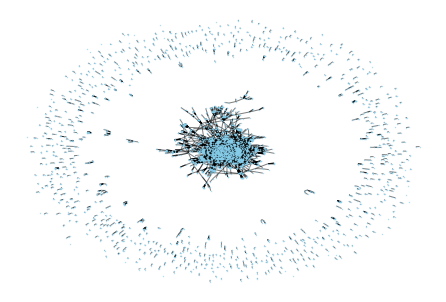

In [ ]:
Emailn = 51740
count = Emailn
nt = 10000

data_s = dfn.head(count)

G = nx.from_pandas_edgelist(data_s.head(nt), 'X-From', 'X-To')

pos = nx.spring_layout(G)
pylab.figure(1)
nx.draw(G, pos, with_labels=False, node_size=1, node_color="skyblue", node_shape="o", alpha=0.5)

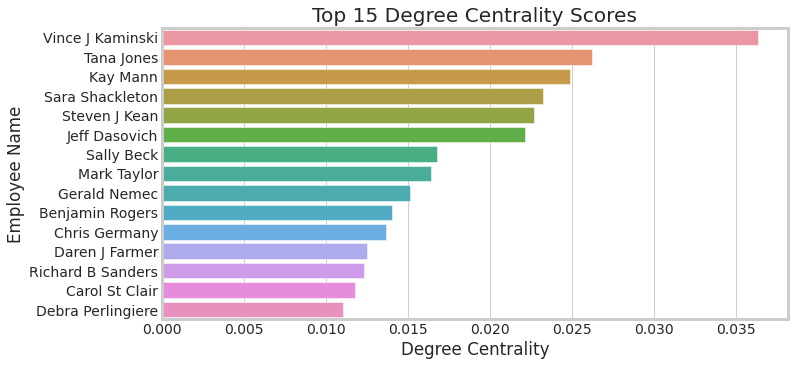

In [ ]:
ct = nx.degree_centrality(G)
name = []
centrality = []

for key, value in ct.items():
    name.append(key)
    centrality.append(value)

ct = pd.DataFrame()    
ct['Employee_name'] = name
ct['Centrality'] = centrality
ct = ct.sort_values(by='Centrality', ascending=False)

plt.figure(figsize=(10, 5))
_ = sns.barplot(x='Centrality', y='Employee_name', data=ct[1:16], orient='h')
_ = plt.xlabel('Degree Centrality')
_ = plt.ylabel('Employee Name')
_ = plt.title('Top 15 Degree Centrality Scores')
plt.show()

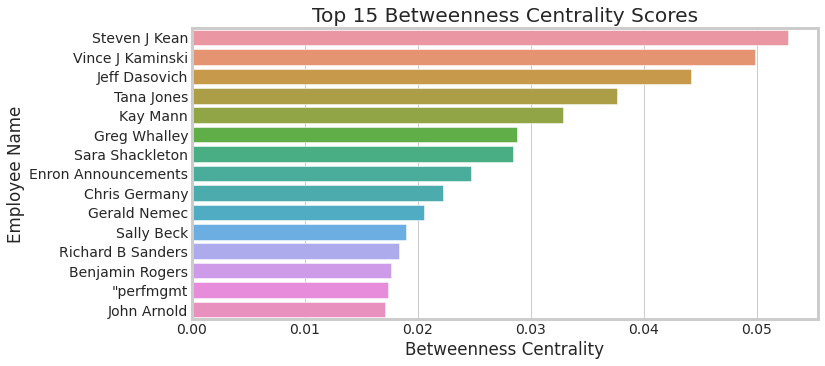

In [ ]:
between = nx.betweenness_centrality(G)
name = []
centrality = []

for key, value in between.items():
    name.append(key)
    centrality.append(value)

between = pd.DataFrame()    
between['Employee_name'] = name
between['BetweennessCentrality'] = centrality
between = between.sort_values(by='BetweennessCentrality', ascending=False)

plt.figure(figsize=(10, 5))
_ = sns.barplot(x='BetweennessCentrality', y='Employee_name', data=between[1:16], orient='h')
_ = plt.xlabel('Betweenness Centrality')
_ = plt.ylabel('Employee Name')
_ = plt.title('Top 15 Betweenness Centrality Scores')
plt.show()


(-1.039144903421402, 1.0798466503620148, -1.09662304520607, 1.0998391926288604)

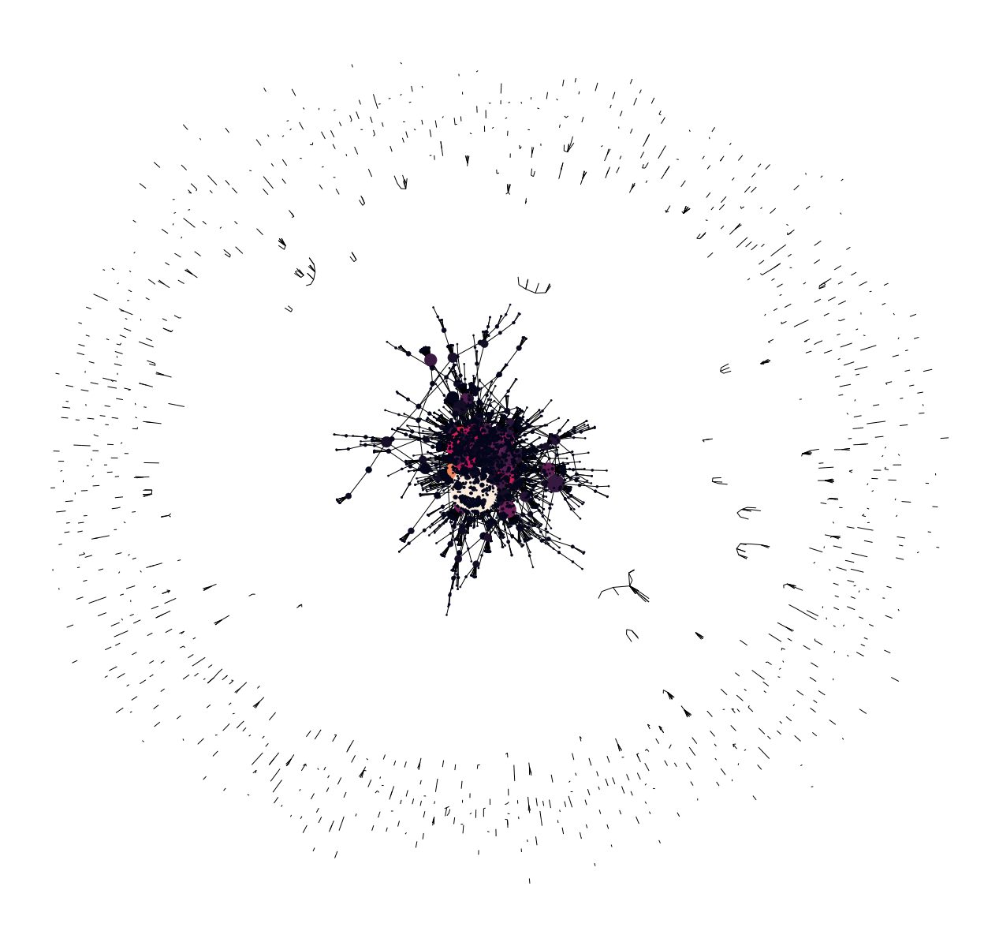

In [ ]:
pos = nx.spring_layout(G)
betCent = nx.betweenness_centrality(G, normalized=True, endpoints=True)
node_color = [1000 * G.degree(v) for v in G]
node_size =  [v * 20000 for v in betCent.values()]
plt.figure(figsize=(20,20))
nx.draw_networkx(G, pos=pos, with_labels=False,
                 node_color=node_color,
                 node_size=node_size )
plt.axis('off')

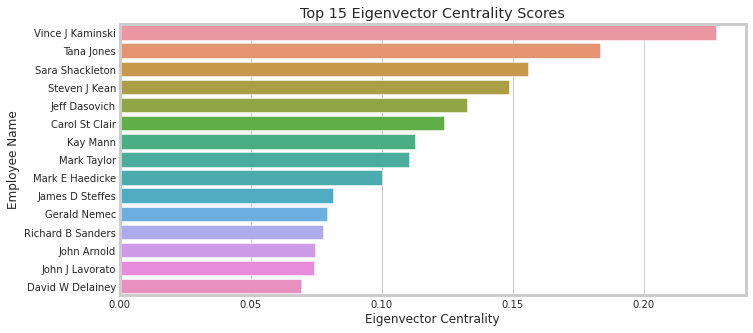

In [ ]:
ec = nx.eigenvector_centrality(G)
name = []
centrality = []

for key, value in ec.items():
    name.append(key)
    centrality.append(value)

ec = pd.DataFrame()    
ec['Employee_name'] = name
ec['EigenvectorCentrality'] = centrality
ec = ec.sort_values(by='EigenvectorCentrality', ascending=False)

plt.figure(figsize=(10, 5))
_ = sns.barplot(x='EigenvectorCentrality', y='Employee_name', data=ec[1:16], orient='h')
_ = plt.xlabel('Eigenvector Centrality')
_ = plt.ylabel('Employee Name')
_ = plt.title('Top 15 Eigenvector Centrality Scores')
plt.show()

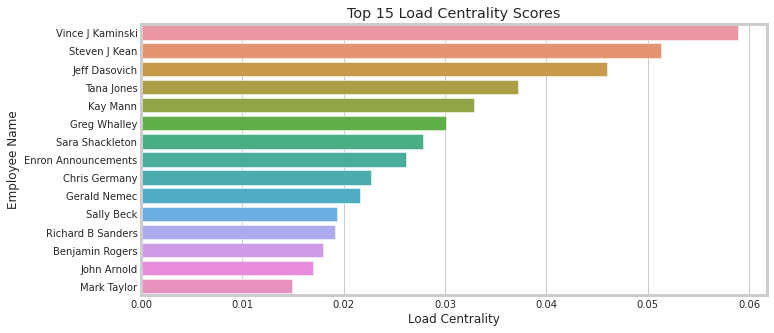

In [ ]:
load = nx.load_centrality(G)
name = []
centrality = []

for key, value in load.items():
    name.append(key)
    centrality.append(value)

load = pd.DataFrame()    
load['Employee_name'] = name
load['Load_Centrality'] = centrality
load = load.sort_values(by='Load_Centrality', ascending=False)

plt.figure(figsize=(10, 5))
_ = sns.barplot(x='Load_Centrality', y='Employee_name', data=load[1:16], orient='h')
_ = plt.xlabel('Load Centrality')
_ = plt.ylabel('Employee Name')
_ = plt.title('Top 15 Load Centrality Scores')
plt.show()

##Kay Mann, Vince J Kaminski, Kate Symes, Jeff Dasovich
Who should take more responsbility based on our net analysis?

###degree centrality

In [ ]:
ct[ct['Employee_name'] =="Kay Mann" ]

In [ ]:
ct[ct['Employee_name'] =="Vince J Kaminski" ]

In [ ]:
ct[ct['Employee_name'] =="Kate Symes" ]

,Employee_name,Centrality
81,Kate Symes,0.010144


In [ ]:
ct[ct['Employee_name'] =="Jeff Dasovich" ]

,Employee_name,Centrality
97,Jeff Dasovich,0.022132


###betweenness centrality

In [ ]:
between[between['Employee_name'] =="Kay Mann" ]

,Employee_name,BetweennessCentrality
2,Kay Mann,0.032857


In [ ]:
between[between['Employee_name'] =="Vince J Kaminski" ]

,Employee_name,BetweennessCentrality
11,Vince J Kaminski,0.049885


In [ ]:
between[between['Employee_name'] =="Kate Symes" ]

,Employee_name,BetweennessCentrality
81,Kate Symes,0.01166


In [ ]:
between[between['Employee_name'] =="Jeff Dasovich" ]

,Employee_name,BetweennessCentrality
97,Jeff Dasovich,0.044192


### Eigenvector Centrality

In [ ]:
ec[ec['Employee_name'] =="Kay Mann" ]

,Employee_name,EigenvectorCentrality
2,Kay Mann,0.112679


In [ ]:
ec[ec['Employee_name'] =="Vince J Kaminski" ]

,Employee_name,EigenvectorCentrality
11,Vince J Kaminski,0.227588


In [ ]:
ec[ec['Employee_name'] =="Kate Symes" ]

,Employee_name,EigenvectorCentrality
81,Kate Symes,0.010594


In [ ]:
ec[ec['Employee_name'] =="Jeff Dasovich" ]

,Employee_name,EigenvectorCentrality
97,Jeff Dasovich,0.132469


### **Load** Centrality


In [ ]:
load[load['Employee_name'] =="Kay Mann" ]

,Employee_name,Load_Centrality
2,Kay Mann,0.032646


In [ ]:
load[load['Employee_name'] =="Vince J Kaminski" ]

,Employee_name,Load_Centrality
11,Vince J Kaminski,0.049303


In [ ]:
load[load['Employee_name'] =="Kate Symes" ]

,Employee_name,Load_Centrality
81,Kate Symes,0.011725


In [ ]:
load[load['Employee_name'] =="Jeff Dasovich" ]

,Employee_name,Load_Centrality
97,Jeff Dasovich,0.043525


##Kay Mann, Vince J Kaminski, Kate Symes, Jeff Dasovich Network Analysis EDA

In [ ]:
top_15_X_From = pd.DataFrame(dfn['X-From'].value_counts()[:15])
top_15_X_From.reset_index(inplace=True)
top_15_X_From.columns = ["Employee_name", "Counts"]
top_15_X_From

,Employee_name,Counts
0,Rhonda L Denton,9899
1,Veronica Espinoza,8961
2,Jeff Dasovich,7986
3,Cheryl Johnson,6967
4,Lorna Brennan,4830
5,Outlook Migration Team,4082
6,Tana Jones,3040
7,Janette Elbertson,2855
8,Ginger Dernehl,2776
9,Susan J Mara,2764


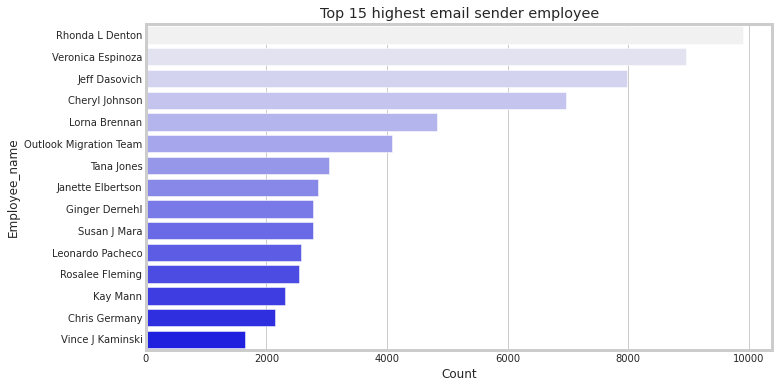

In [ ]:
plt.figure(figsize=(10,6))

sns.barplot(y="Employee_name", x="Counts", data=top_15_X_From, palette="light:b")
plt.title("Top 15 highest email sender employee")
plt.xlabel("Count")
plt.ylabel("Employee_name")
plt.show()

### Kay Mann

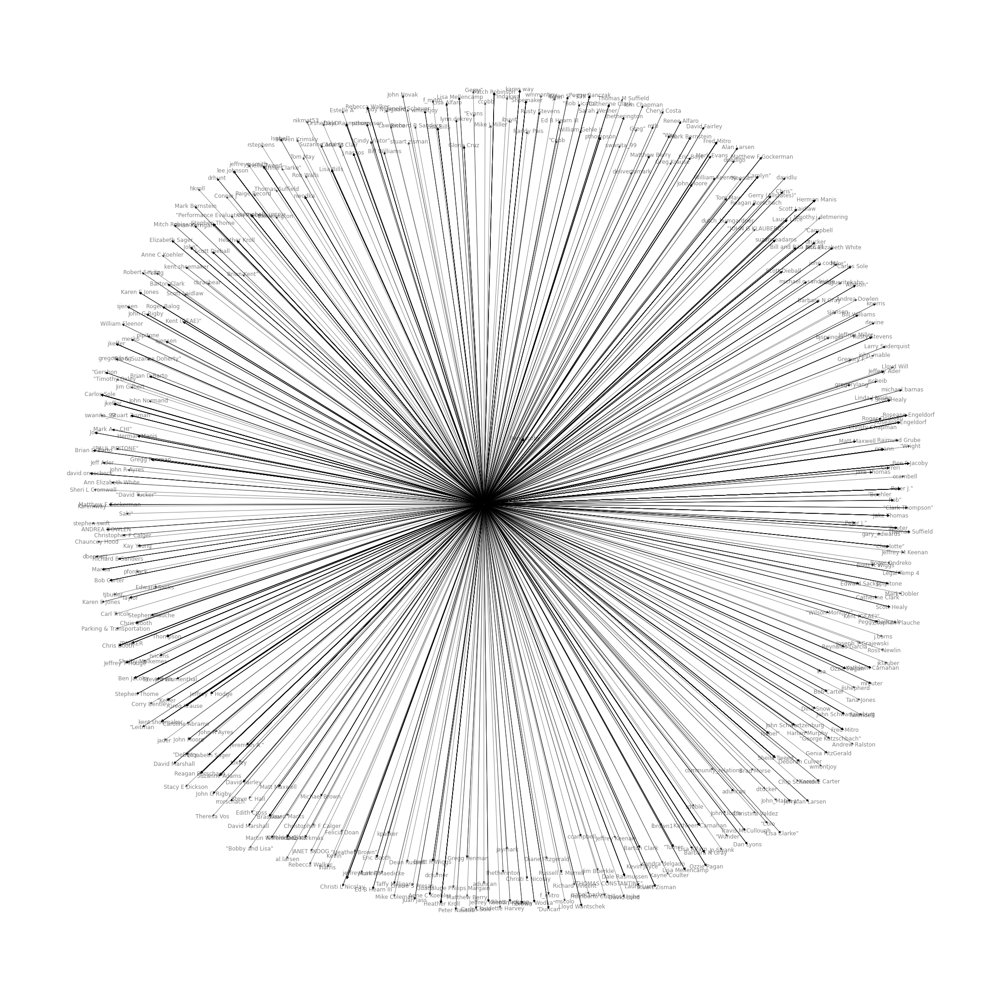

In [ ]:
G=nx.from_pandas_edgelist(dfn[dfn['X-From']=="Kay Mann"], "X-From", "X-To",  create_using=nx.MultiDiGraph())
plt.figure(figsize=(30,30))
pos = nx.spring_layout(G) 
nx.draw(G, pos, with_labels=True, node_size=1, node_color="skyblue", node_shape="o", alpha=0.5)

In [ ]:
demo = dfn[['X-From', 'X-To']]
top_15_X_From_kay = demo[demo['X-From'] == "Kay Mann"]
top_15_X_From_kay.columns = ["Employee_name", "Counts"]
top_15_X_From_kay

,Employee_name,Counts
4,Kay Mann,Suzanne Adams
34,Kay Mann,pthompson
107,Kay Mann,Scott Laidlaw
108,Kay Mann,ppipitone
203,Kay Mann,Gregg Penman
...,...,...
224855,Kay Mann,"Jeremiah A."""
225309,Kay Mann,"""Campbell"
225310,Kay Mann,"Carolyn"""
226373,Kay Mann,"""Turner"


In [ ]:
top_15_X_From_kay1 = pd.DataFrame(top_15_X_From_kay['Counts'].value_counts()[:15])
top_15_X_From_kay1.reset_index(inplace=True)
top_15_X_From_kay1.columns = ["Employee_name", "Counts"]
top_15_X_From_kay1

,Employee_name,Counts
0,Suzanne Adams,177
1,Kathleen Carnahan,79
2,Carlos Sole,71
3,nmann,60
4,Sheila Tweed,56
5,Roseann Engeldorf,47
6,Ben Jacoby,44
7,Reagan Rorschach,38
8,Roseann Engeldorf,36
9,"""Thompson",34


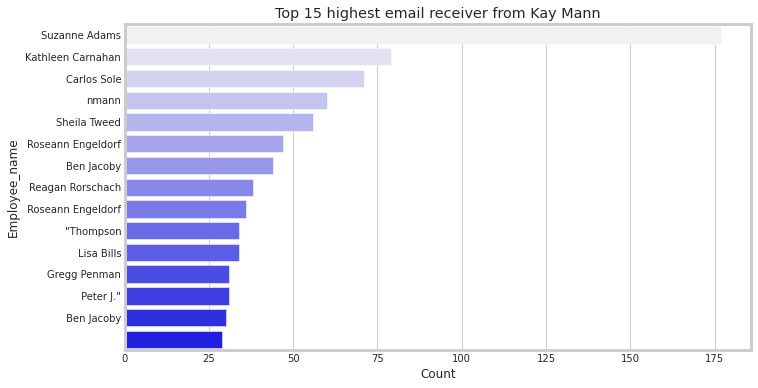

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(y="Employee_name", x="Counts", data=top_15_X_From_kay1, palette="light:b")
plt.title("Top 15 highest email receiver from Kay Mann")
plt.xlabel("Count")
plt.ylabel("Employee_name")
plt.show()

### Vince J Kaminski

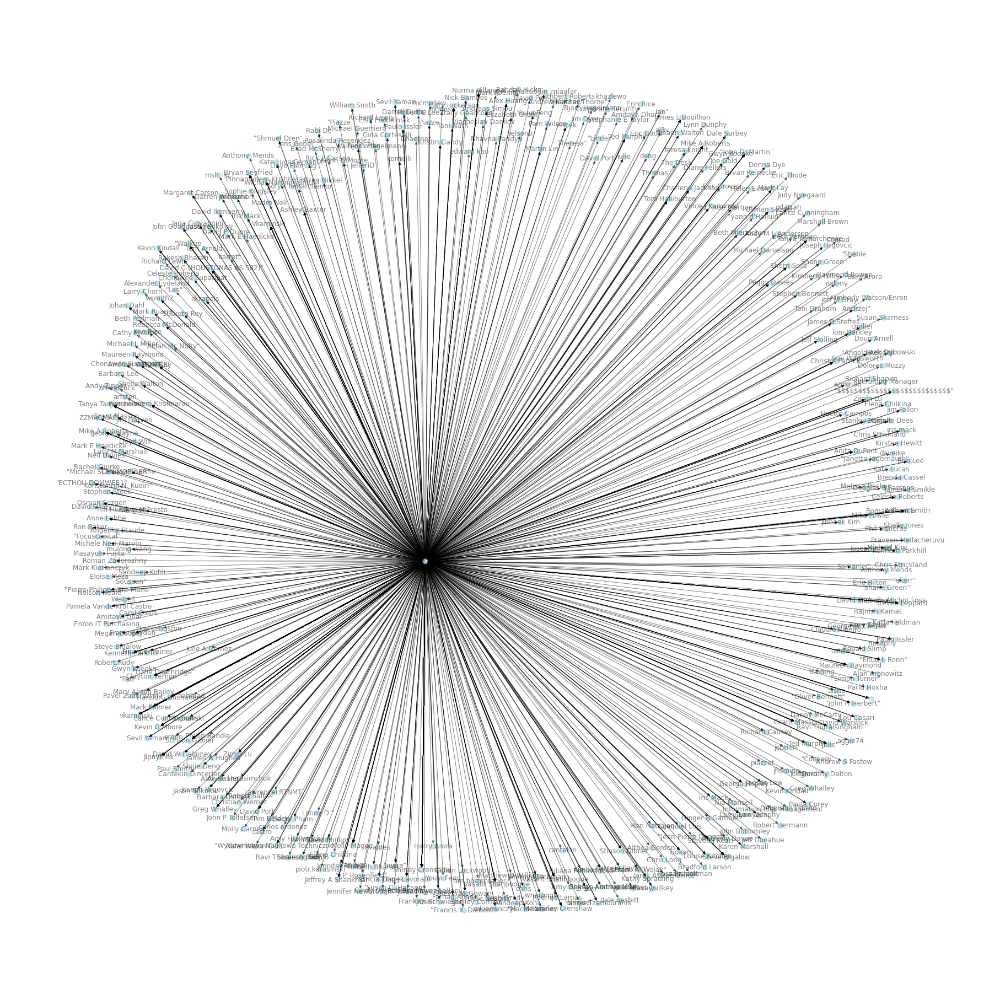

In [ ]:
G=nx.from_pandas_edgelist(dfn[dfn['X-From']=="Vince J Kaminski"], "X-From", "X-To", create_using=nx.MultiDiGraph())
plt.figure(figsize=(25,25))
pos = nx.spring_layout(G, k = 0.5) # k regulates the distance between nodesnx.draw(G, with_labels=True, node_color='skyblue', node_size=1500, edge_cmap=plt.cm.Blues, pos = pos)plt.show()
nx.draw(G, pos, with_labels=True, node_size=100, node_color="skyblue", node_shape="o", alpha=0.5)

In [ ]:
demo = dfn[['X-From', 'X-To']]
top_15_X_From_kaminski = demo[demo['X-From'] == "Vince J Kaminski"]
top_15_X_From_kaminski.columns = ["Employee_name", "Counts"]
top_15_X_From_kaminski

,Employee_name,Counts
45,Vince J Kaminski,mulong wang
56,Vince J Kaminski,Walter Coffer
60,Vince J Kaminski,vkaminski
128,Vince J Kaminski,Danielle Dees
173,Vince J Kaminski,Anita DuPont
...,...,...
217460,Vince J Kaminski,Vasant Shanbhogue
217461,Vince J Kaminski,Kevin Kindall
217462,Vince J Kaminski,Grant Masson
222339,Vince J Kaminski,"""Piazze"


In [ ]:
top_15_X_From_kaminski1 = pd.DataFrame(top_15_X_From_kaminski['Counts'].value_counts()[:15])
top_15_X_From_kaminski1.reset_index(inplace=True)
top_15_X_From_kaminski1.columns = ["Employee_name", "Counts"]
top_15_X_From_kaminski1

,Employee_name,Counts
0,vkaminski,424
1,Shirley Crenshaw,120
2,Stinson Gibner,40
3,Molly Magee,19
4,Steven Leppard,17
5,Grant Masson,16
6,Mike A Roberts,16
7,Vince J Kaminski,14
8,Vkaminski,14
9,Vasant Shanbhogue,14


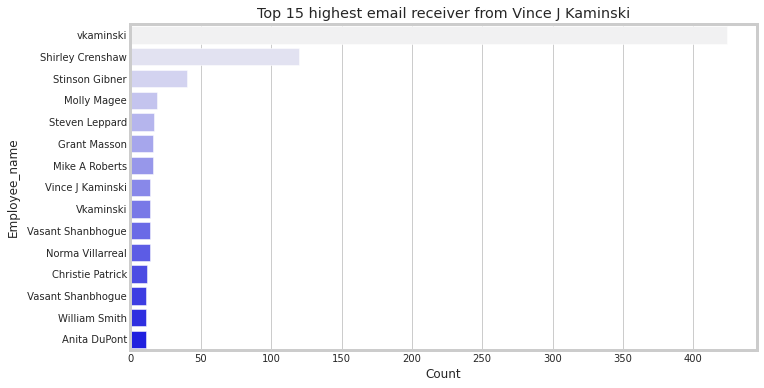

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(y="Employee_name", x="Counts", data=top_15_X_From_kaminski1, palette="light:b")
plt.title("Top 15 highest email receiver from Vince J Kaminski")
plt.xlabel("Count")
plt.ylabel("Employee_name")
plt.show()

### Jeff Dasovich

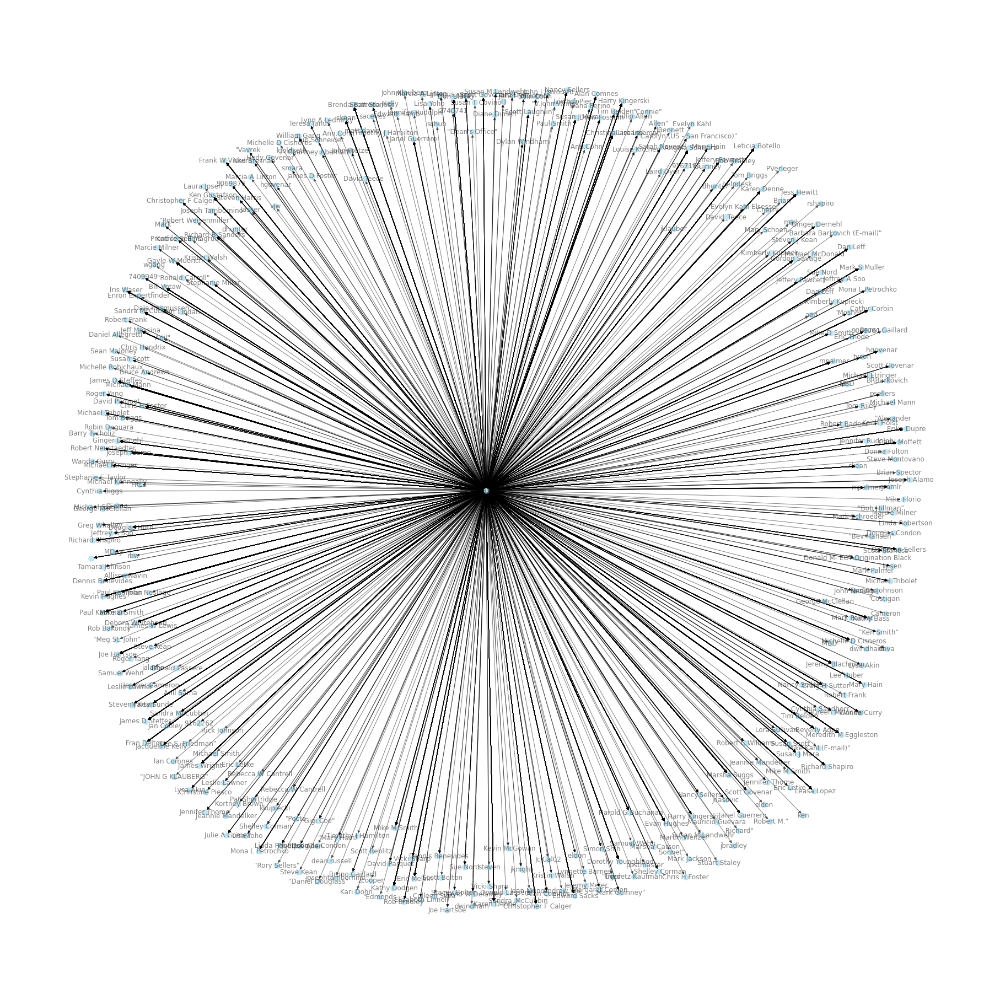

In [ ]:
G=nx.from_pandas_edgelist(dfn[dfn['X-From']=="Jeff Dasovich"], "X-From", "X-To", create_using=nx.MultiDiGraph())
plt.figure(figsize=(25,25))
pos = nx.spring_layout(G, k = 0.5) # k regulates the distance between nodesnx.draw(G, with_labels=True, node_color='skyblue', node_size=1500, edge_cmap=plt.cm.Blues, pos = pos)plt.show()
nx.draw(G, pos, with_labels=True, node_size=100, node_color="skyblue", node_shape="o", alpha=0.5)

In [ ]:
demo = dfn[['X-From', 'X-To']]
top_15_X_From_dasovich = demo[demo['X-From'] == "Jeff Dasovich"]
top_15_X_From_dasovich.columns = ["Employee_name", "Counts"]
top_15_X_From_dasovich

,Employee_name,Counts
111,Jeff Dasovich,tyson
320,Jeff Dasovich,James D Steffes
365,Jeff Dasovich,Richard Shapiro
440,Jeff Dasovich,John Protzel
680,Jeff Dasovich,Dan Leff
...,...,...
225613,Jeff Dasovich,Karen Denne
225614,Jeff Dasovich,mpalmer
225816,Jeff Dasovich,Sandra McCubbin
225817,Jeff Dasovich,Susan J Mara


In [ ]:
top_15_X_From_dasovich1 = pd.DataFrame(top_15_X_From_dasovich['Counts'].value_counts()[:15])
top_15_X_From_dasovich1.reset_index(inplace=True)
top_15_X_From_dasovich1.columns = ["Employee_name", "Counts"]
top_15_X_From_dasovich1

,Employee_name,Counts
0,James D Steffes,195
1,Harry Kingerski,149
2,Karen Denne,145
3,Joe Hartsoe,144
4,mpalmer,143
5,Dennis Benevides,135
6,Alan Comnes,134
7,Jeremy Blachman,130
8,Evan Hughes,130
9,Ginger Dernehl,130


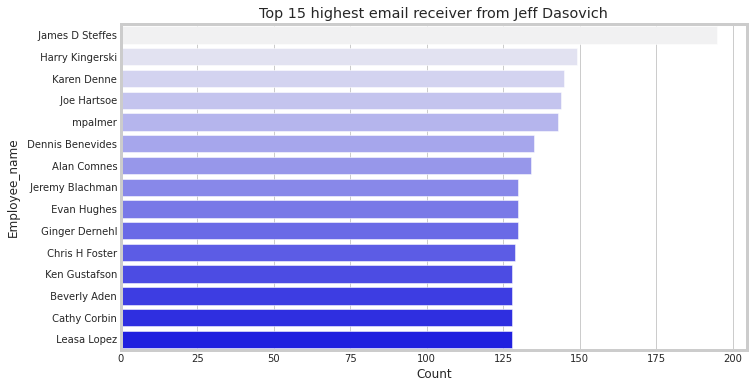

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(y="Employee_name", x="Counts", data=top_15_X_From_dasovich1, palette="light:b")
plt.title("Top 15 highest email receiver from Jeff Dasovich")
plt.xlabel("Count")
plt.ylabel("Employee_name")
plt.show()

### Kate Symes

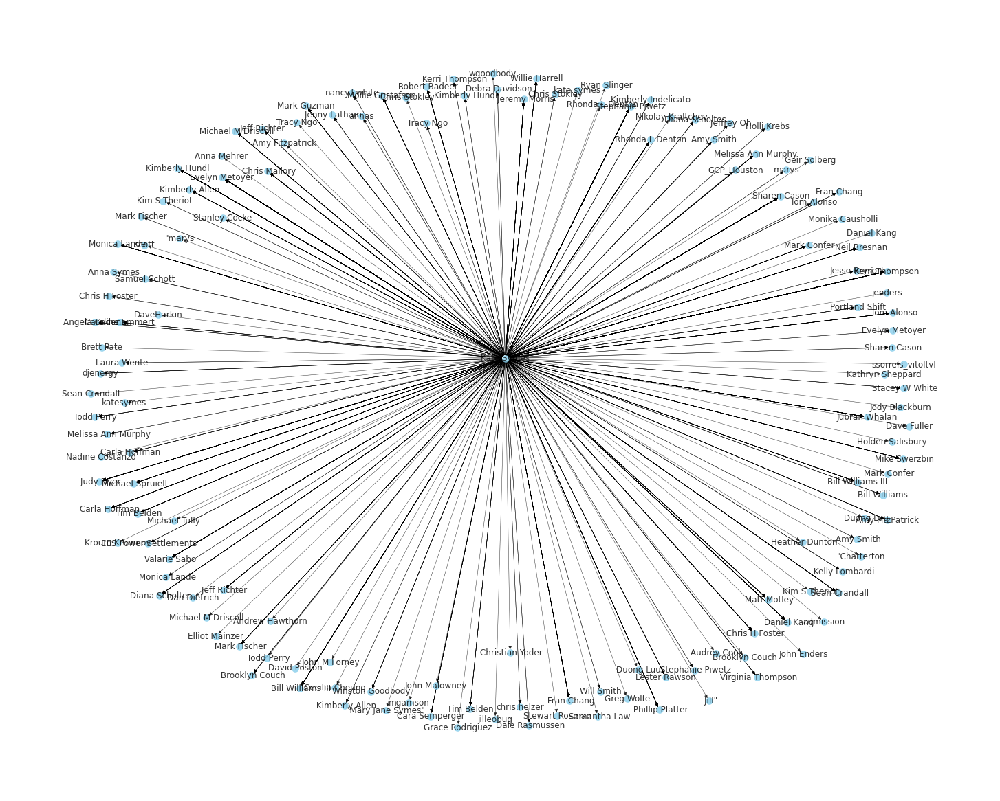

In [ ]:
G = nx.from_pandas_edgelist(dfn[dfn['X-From']=="Kate Symes"], "X-From", "X-To",  create_using=nx.MultiDiGraph())
pos = nx.spring_layout(G)
pylab.figure(figsize=(20, 16))
nx.draw(G, pos, with_labels=True, node_size=100, node_color="skyblue", node_shape="o", alpha=0.8,width=0.5)


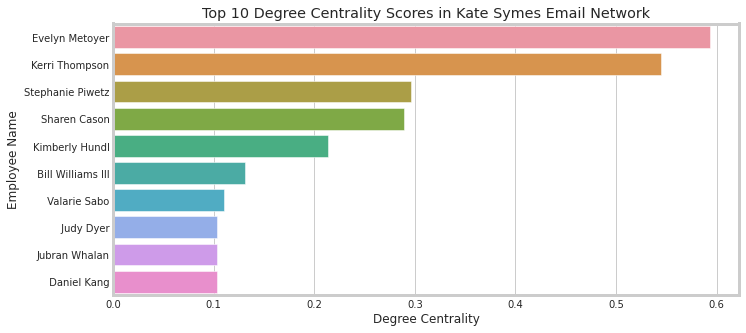

In [ ]:
ctk = nx.degree_centrality(G)
name = []
centrality = []

for key, value in ctk.items():
    name.append(key)
    centrality.append(value)

ctk = pd.DataFrame()    
ctk['Employee_name'] = name
ctk['Centrality'] = centrality
ctk = ctk.sort_values(by='Centrality', ascending=False)

plt.figure(figsize=(10, 5))
_ = sns.barplot(x='Centrality', y='Employee_name', data=ctk[1:11], orient='h')
_ = plt.xlabel('Degree Centrality')
_ = plt.ylabel('Employee Name')
_ = plt.title('Top 10 Degree Centrality Scores in Kate Symes Email Network')
plt.show()


In [ ]:
demo = dfn[['X-From', 'X-To']]
top_15_X_From_Symes = demo[demo['X-From'] == "Kate Symes"]
top_15_X_From_Symes.columns = ["Employee_name", "Counts"]
top_15_X_From_Symes

,Employee_name,Counts
90,Kate Symes,Evelyn Metoyer
153,Kate Symes,Sharen Cason
204,Kate Symes,Stephanie Piwetz
319,Kate Symes,Evelyn Metoyer
381,Kate Symes,Evelyn Metoyer
...,...,...
214771,Kate Symes,Monica Lande
214772,Kate Symes,Fran Chang
214773,Kate Symes,Valarie Sabo
221493,Kate Symes,Willie Harrell


In [ ]:
top_15_X_From_Symes1 = pd.DataFrame(top_15_X_From_Symes['Counts'].value_counts()[:15])
top_15_X_From_Symes1.reset_index(inplace=True)
top_15_X_From_Symes1.columns = ["Employee_name", "Counts"]
top_15_X_From_Symes1

,Employee_name,Counts
0,Evelyn Metoyer,86
1,Kerri Thompson,79
2,Stephanie Piwetz,43
3,Sharen Cason,42
4,Kimberly Hundl,31
5,Bill Williams III,19
6,Valarie Sabo,16
7,Daniel Kang,15
8,Judy Dyer,15
9,Neil Bresnan,15


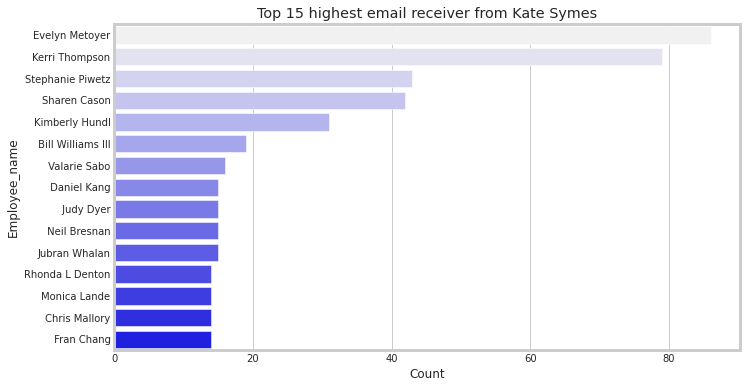

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(y="Employee_name", x="Counts", data=top_15_X_From_Symes1, palette="light:b")
plt.title("Top 15 highest email receiver from Kate Symes")
plt.xlabel("Count")
plt.ylabel("Employee_name")
plt.show()

# Text Cleaning

In [ ]:
df1 = df.copy()

In [ ]:
# clean X-Folder
def preprocess_folder(folders):
    column = []
    for folder in folders:
        if (folder is None or folder == ""):
            column.append(np.nan)
        else:
            column.append(folder.split("\\")[-1].lower())
    return column

df1['X-Folder'] = preprocess_folder(df1['X-Folder'])
df1.head(2)

,file,message,date,subject,X-Folder,From,To,X-From,X-To,body,employee
0,allen-p/_sent_mail/552.,Message-ID: <26913174.1075855728319.JavaMail.e...,"Thu, 25 Jan 2001 02:11:00 -0800 (PST)",,'sent mail,phillip.allen@enron.com,stagecoachmama@hotmail.com,Phillip K Allen,stagecoachmama@hotmail.com,"Lucy,\n\n#32 and #29 are fine. \n\n#28 paid w...",allen-p
1,kaminski-v/deleted_items/527.,Message-ID: <27472138.1075840765904.JavaMail.e...,"Mon, 14 Jan 2002 08:29:13 -0800 (PST)",,deleted items,jlew@reliant.com,j.kaminski@enron.com,"""Lew, Jaesoo"" <JLew@reliant.com>@ENRON","Kaminski, Vince J </O=ENRON/OU=NA/CN=RECIPIENT...","Hi Vince,\n\nHow are you?\n\nI'm doing well at...",kaminski-v


In [ ]:
# count unique folders
print("Unique Foldes: ", len(df1['X-Folder'].unique()))

# view some of them
df1['X-Folder'].unique()[0:20]

Unique Foldes:  1005


array(["'sent mail", 'deleted items', 'inbox', 'sent', 'all documents',
       'sent items', 'alaska gas', 'notes inbox', 'board', 'calendar',
       'international', 'ibuyit', 'eesirenewableenergy', 'logistics',
       'discussion threads', 'market intel', 'client rep',
       'perfomance evaluation', 'bill williams iii', 'personal'],
      dtype=object)

In [ ]:
# replace missing value with na
def replace_empty_with_nan(subject):
    column = []
    for val in subject:
        if (val == ""):
            column.append(np.nan) 
        else:
            column.append(val)
    return column

In [ ]:
df1['subject'] = replace_empty_with_nan(df1['subject'])
df1['X-To'] = replace_empty_with_nan(df1['X-To'])

In [ ]:
df1.isnull().sum()

file           0
message        0
date           0
subject     1976
X-Folder       1
From           0
To          2196
X-From         1
X-To         920
body           0
employee       0
dtype: int64

In [ ]:
# drop missing value rows
df1.dropna(axis=0, inplace=True)

In [ ]:
df1.isnull().sum(), df1.shape

(file        0
 message     0
 date        0
 subject     0
 X-Folder    0
 From        0
 To          0
 X-From      0
 X-To        0
 body        0
 employee    0
 dtype: int64, (47603, 11))

In [ ]:
df3 = df1.copy()

In [ ]:
df1.drop(['file','message','date','X-From','X-To'], axis=1, inplace=True)

In [ ]:
df1.head()

,subject,X-Folder,From,To,body
2,NewsBeat:Daily News 11/15/2001,inbox,avril.forster@enron.com,"laura.bosek@enron.com, greg.bruch@enron.com, j...",\n \n <http://www.forestweb.com/digest/image...
3,FW: New York Power Authority RFP,inbox,rob.wheeler@enron.com,"gautam.gupta@enron.com, robert.benson@enron.com",Attached is an RFP from NYPA. They are seekin...
4,Turbine assignment clause,sent,kay.mann@enron.com,suzanne.adams@enron.com,Please print and fax this to Sheila. You don'...
5,CA legislature in doubt,all documents,jeff.dasovich@enron.com,"karen.denne@enron.com, james.steffes@enron.com...",Karen:\nSee highlited section of story below. ...
6,RE: bs,sent items,matthew.lenhart@enron.com,kevin.a.boone@accenture.com,i think the only way to burn it on my cpu is d...


In [ ]:
len(df1)

47603

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
def clean_column(data):
    if data is not None:
        stopwords_list = stopwords.words('english')
        #exclusions = ['RE:', 'Re:', 're:']
        #exclusions = '|'.join(exclusions)
        data =  data.lower()
        data = re.sub('re:', '', data)
        data = re.sub('-', '', data)
        data = re.sub('_', '', data)
        # Remove data between square brackets
        data =re.sub('\[[^]]*\]', '', data)
        # removes punctuation
        data = re.sub(r'[^\w\s]','',data)
        data = re.sub(r'\n',' ',data)
        data = re.sub(r'[0-9]+','',data)
        # strip html 
        p = re.compile(r'<.*?>')
        data = re.sub(r"\'ve", " have ", data)
        data = re.sub(r"can't", "cannot ", data)
        data = re.sub(r"n't", " not ", data)
        data = re.sub(r"I'm", "I am", data)
        data = re.sub(r" m ", " am ", data)
        data = re.sub(r"\'re", " are ", data)
        data = re.sub(r"\'d", " would ", data)
        data = re.sub(r"\'ll", " will ", data)
        data = re.sub('forwarded by phillip k allenhouect on    pm', '',data)
        data = re.sub(r"httpitcappscorpenroncomsrrsauthemaillinkaspidpage", "", data)
        
        data = p.sub('', data)
        if 'forwarded by:' in data:
            data = data.split('subject')[1]
        data = data.strip()
        return data
    return 'No Subject'


df1['subject_new'] = df1['subject'].apply(clean_column) 
df1['body_new'] = df1['body'].apply(clean_column)

In [ ]:
df1.isnull().sum()

In [ ]:
# drop missing value rows
df1.dropna(axis=0, inplace=True)

In [ ]:
df1.isnull().sum()

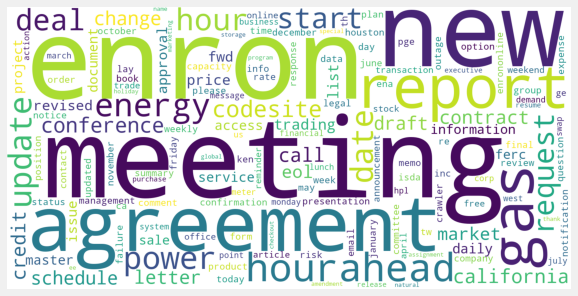

In [ ]:
from wordcloud import WordCloud
wordcloud = WordCloud(
                          collocations = False,
                          width=1600, height=800,
                          background_color='white',
                          stopwords=stopwords,
                          max_words=150,
                          #max_font_size=40, 
                          random_state=20
                         ).generate(' '.join(df1['subject_new'])) # can't pass a series, needs to be strings and function computes frequencies
print(wordcloud)
plt.figure(figsize=(9,8))
fig = plt.figure(1)
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [ ]:
df1['body_new'].head(5)

2    httpwwwforestwebcomdigestimagesnewscorpsgif  n...
3    attached is an rfp from nypa  they are seeking...
4    please print and fax this to sheila  you dont ...
5    karen see highlited section of story below  pg...
6    i think the only way to burn it on my cpu is d...
Name: body_new, dtype: object

In [ ]:
from wordcloud import STOPWORDS
stopwords = set(STOPWORDS)
to_add = ['FW', 'ga', 'httpitcappscorpenroncomsrrsauthemaillinkaspidpage','ge', 'cc', 'aa', 'aaa', 'aaaa','aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa',
         'hou', 'cc', 'etc', 'subject', 'pm','httpwwwforestwebcomdigestimagesnewscorpsgif']

for i in to_add:
    stopwords.add(i)

In [ ]:
stemmer = PorterStemmer()
def stemming_tokenizer(str_input):
    words = re.sub(r"[^A-Za-z0-9\-]", " ", str_input).lower().split()
    words = [porter_stemmer.stem(word) for word in words]
    return words

In [ ]:
def tokenize_and_stem(text):
    # first tokenize by sentence, then by word to ensure that punctuation is caught as it's own token
    tokens = [word for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent)]
    filtered_tokens = []
    # filter out any tokens not containing letters (e.g., numeric tokens, raw punctuation)
    for token in tokens:
        if re.search('[a-zA-Z]', token):
            filtered_tokens.append(token)
    stems = [stemmer.stem(t) for t in filtered_tokens]
    return stems

In [ ]:
df1 = pd.read_csv("/content/drive/Shareddrives/820 team/dataset/clean-data.csv")

In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
data = df1['body_new']
# data.head()

tf_idf_vectorizor = TfidfVectorizer(stop_words = stopwords, #tokenizer = tokenize_and_stem,
                             max_features = 5000)
tf_idf = tf_idf_vectorizor.fit_transform(data)
tf_idf_norm = normalize(tf_idf)
tf_idf_array = tf_idf_norm.toarray()

pd.DataFrame(tf_idf_array, columns=tf_idf_vectorizor.get_feature_names()).head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['aren', 'couldn', 'didn', 'doesn', 'don', 'fw', 'hadn', 'hasn', 'haven', 'isn', 'let', 'll', 'mustn', 're', 'shan', 'shouldn', 've', 'wasn', 'weren', 'won', 'wouldn'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


,aaron,ab,abb,ability,able,abraham,absence,absolutely,abx,ac,accept,acceptable,acceptance,accepted,access,accessing,accommodate,accomplish,accordance,according,accordingly,account,accounting,accounts,accrual,accuracy,accurate,achieve,acknowledge,acknowledged,acquire,acquired,acquisition,acquisitions,across,act,acting,action,actions,active,...,worse,worst,worth,wouldnt,wpd,wr,wright,write,writer,writers,writes,writing,written,wrong,wrote,wwwblackberrynet,xls,xmailer,xms,ya,yahoo,yards,yeah,year,yearend,years,yes,yesterday,yesterdays,yet,yo,york,youd,youll,young,youre,youve,zero,zimin,zone
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.027192,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.041861,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.024342,0.0,0.000000,0.0,0.030875,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.102112,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.103102,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.132163,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.074087,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.062042,0.029084,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.069436,0.0,0.000000,0.0,0.048421,0.0,0.000000,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.039254,0.0,0.000000,0.048103,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.039519,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.00000,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.110816,0.0,0.000000,0.0,0.0,0.0,0.123273,0.14456,0.0,0.0,0.0


# KMeans

In [ ]:
# pca
sklearn_pca = PCA(n_components = 2)
Y_sklearn = sklearn_pca.fit_transform(tf_idf_array) 

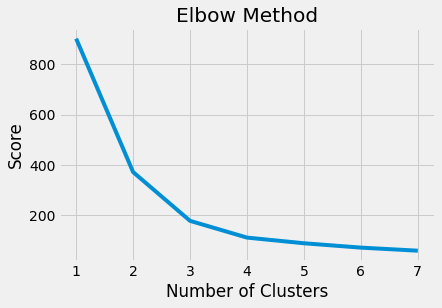

In [ ]:
# choose optimal clusters
number_clusters = range(1, 8)

kmeans = [KMeans(n_clusters=i, max_iter = 600) for i in number_clusters]
kmeans

Y_sklearn = sklearn_pca.fit_transform(tf_idf_array)
score = [kmeans[i].fit(Y_sklearn).score(Y_sklearn) for i in range(len(kmeans))]
score = [i*-1 for i in score]

plt.plot(number_clusters, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Method')
plt.show()

CPU times: user 570 ms, sys: 474 ms, total: 1.04 s
Wall time: 539 ms


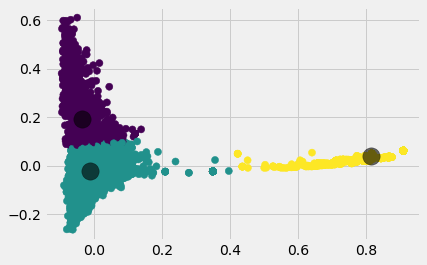

In [ ]:
# k-means
n_clusters = 3
kmeans = KMeans(n_clusters= n_clusters, max_iter=600, algorithm = 'auto')
%time fitted = kmeans.fit(Y_sklearn)
prediction = kmeans.predict(Y_sklearn)

plt.scatter(Y_sklearn[:, 0], Y_sklearn[:, 1],c=prediction ,s=50, cmap='viridis')

centers2 = fitted.cluster_centers_
plt.scatter(centers2[:, 0], centers2[:, 1],c='black', s=300, alpha=0.6)

In [ ]:
df1["K-clust"] = prediction

In [ ]:
def get_top_features_cluster(tf_idf_array, prediction, n_feats):
    labels = np.unique(prediction)
    dfs = []
    for label in labels:
        id_temp = np.where(prediction==label) # indices for each cluster
        x_means = np.mean(tf_idf_array[id_temp], axis = 0) # returns average score across cluster
        sorted_means = np.argsort(x_means)[::-1][:n_feats] # indices with top 15 scores
        features = tf_idf_vectorizor.get_feature_names()
        best_features = [(features[i], x_means[i]) for i in sorted_means]
        df = pd.DataFrame(best_features, columns = ['features', 'score'])
        dfs.append(df)
    return dfs
dfs = get_top_features_cluster(tf_idf_array, prediction, 15)

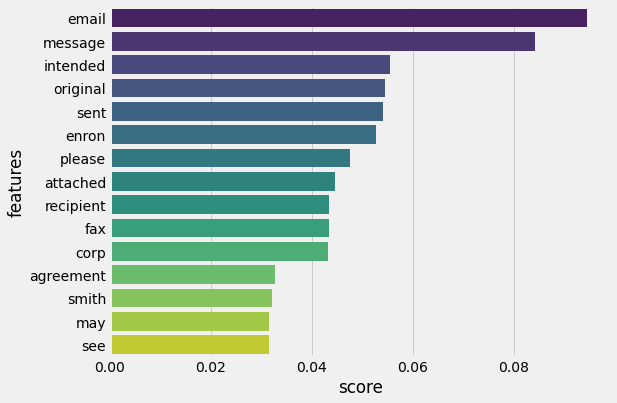

In [ ]:

plt.figure(figsize=(8,6))
sns.barplot(x = 'score' , y = 'features', orient = 'h' , data = dfs[0][:15],palette="viridis")

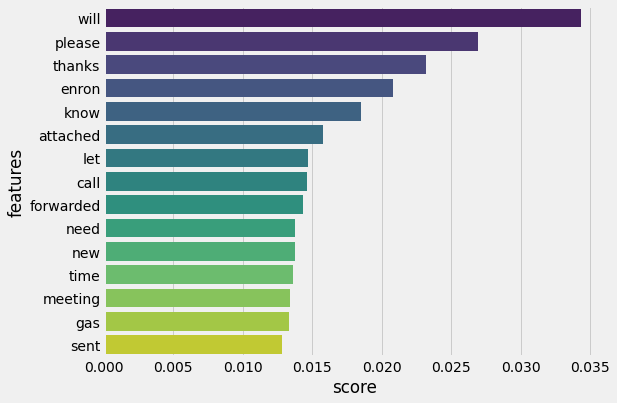

In [ ]:
plt.figure(figsize=(8,6))
sns.barplot(x = 'score' , y = 'features', orient = 'h' , data = dfs[1][:15],palette="viridis")

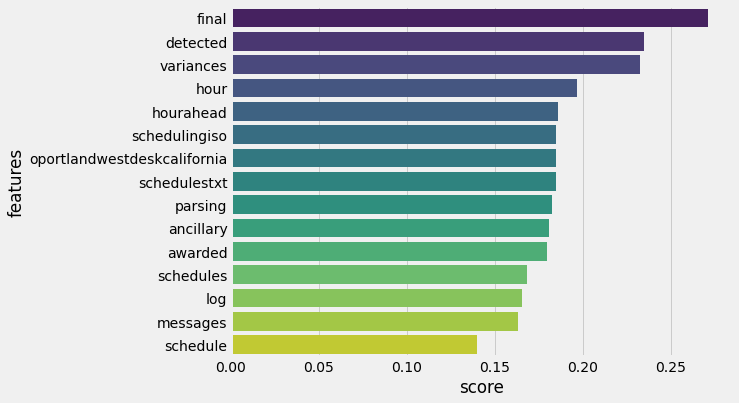

In [ ]:
plt.figure(figsize=(8,6))
sns.barplot(x = 'score' , y = 'features', orient = 'h' , data = dfs[2][:15],palette="viridis")

## 3rd Cluster

In [ ]:
clust3 = df1[df1["K-clust"]==2]

In [ ]:
clust3.head(3)

,subject,X-Folder,From,To,body,employee,subject_new,body_new,K-clust
73,Start Date: 3/9/01; HourAhead hour: 5; <CODES...,notes inbox,pete.davis@enron.com,pete.davis@enron.com,Start Date: 3/9/01; HourAhead hour: 5; No anc...,guzman-m,start date hourahead hour codesite,start date hourahead hour no ancillary sche...,2
97,Start Date: 4/17/01; HourAhead hour: 8; <CODE...,discussion threads,pete.davis@enron.com,pete.davis@enron.com,Start Date: 4/17/01; HourAhead hour: 8; No an...,merriss-s,start date hourahead hour codesite,start date hourahead hour no ancillary sche...,2
113,Start Date: 4/26/01; HourAhead hour: 7; <CODE...,all documents,pete.davis@enron.com,pete.davis@enron.com,Start Date: 4/26/01; HourAhead hour: 7; No an...,merriss-s,start date hourahead hour codesite,start date hourahead hour no ancillary sche...,2


In [ ]:
print(clust3["From"].unique())
print(clust3["To"].unique())

['pete.davis@enron.com']
['pete.davis@enron.com']


In [ ]:
cluster3_top_e = pd.DataFrame(clust3['employee'].value_counts())
cluster3_top_e.reset_index(inplace=True)
cluster3_top_e.columns = ["Employee_name", "Counts"]
cluster3_top_e 

,Employee_name,Counts
0,guzman-m,212
1,linder-e,193
2,williams-w3,116
3,merriss-s,95
4,solberg-g,70
5,meyers-a,53
6,dean-c,43
7,platter-p,2
8,causholli-m,1


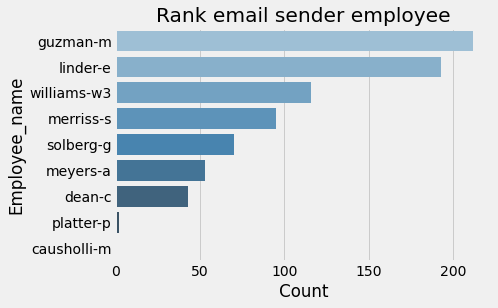

In [ ]:

plt.figure(figsize=(6,4))

sns.barplot(y="Employee_name", x="Counts", data=cluster3_top_e, palette="Blues_d")
plt.title("Rank email sender employee")
plt.xlabel("Count")
plt.ylabel("Employee_name")
plt.show()

In [ ]:
#df1.to_csv("/content/drive/Shareddrives/820 team/dataset/clean-data.csv")

In [ ]:
df = df1[df1["sender"], df1["to"]]

In [ ]:
l = []
for i in range(len(df.shape[0])):
  l = df["to"][i].split(",")
  n=len(l)
  for j in range(n):
    new_row = pd.Series(data ={"sender":df["sender"][i], "to":l[j]})
    df.append(new_row, ignore_index = False)
